# Predicting Loan Default Risk: Leveraging Data for Smarter Credit Decisions
#### By Esther O. Peter

## Introduction

## The Challenge: Navigating Loan Risk


##### Financial institutions face significant challenges in accurately assessing loan default risk. Traditional methods often fall short in today's complex financial landscape.


#### Problem Statement

###### * Develop a robust machine learning pipeline; 
###### * To predict loan default risk;
###### * Enabling better credit decisions and;
###### * Minimizing financial losses.


#### Solution
##### The analysis will leverage three datasets: Performance, Demographics and Previous datasets. Customer behavioral and financial data will be used to build a predictive model, enhancing accuracy and efficiency in risk assessment.


# Performance Dataset

In [22]:
#import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [35]:
# import data to the dataframe
df_perf = pd.read_csv('Documents/2025/Data Science/Datasets/train_perf.csv')
df_perf

,customerid,systemloanid,loannumber,approveddate,creationdate,loanamount,totaldue,termdays,referredby,good_bad_flag
0,8a2a81a74ce8c05d014cfb32a0da1049,301994762,12,00:22:56,00:22:47,30000,34500.0,30,NaN,Good
1,8a85886e54beabf90154c0a29ae757c0,301965204,2,00:04:41,00:04:18,15000,17250.0,30,NaN,Good
2,8a8588f35438fe12015444567666018e,301966580,7,00:52:57,00:52:51,20000,22250.0,15,NaN,Good
3,8a85890754145ace015429211b513e16,301999343,3,00:00:41,00:00:35,10000,11500.0,15,NaN,Good
4,8a858970548359cc0154883481981866,301962360,9,00:42:45,00:42:39,40000,44000.0,30,NaN,Good
...,...,...,...,...,...,...,...,...,...,...
4363,8a858e6d58b0cc520158beeb14b22a5a,302003163,2,00:19:42,00:18:30,10000,13000.0,30,NaN,Bad
4364,8a858ee85cf400f5015cf44ab1c42d5c,301998967,2,00:35:47,00:35:40,10000,13000.0,30,NaN,Bad
4365,8a858f365b2547f3015b284597147c94,301995576,3,00:25:57,00:24:47,10000,11500.0,15,NaN,Bad
4366,8a858f935ca09667015ca0ee3bc63f51,301977679,2,00:50:27,00:50:21,10000,13000.0,30,8a858eda5c8863ff015c9dead65807bb,Bad


### Data Understanding

In [36]:
df_perf.shape


(4368, 10)

In [37]:
df_perf.columns

Index(['customerid', 'systemloanid', 'loannumber', 'approveddate',
       'creationdate', 'loanamount', 'totaldue', 'termdays', 'referredby',
       'good_bad_flag'],
      dtype='object')

In [38]:
df_perf['customerid'].duplicated().sum()

0

In [39]:
df_perf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4368 entries, 0 to 4367
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   customerid     4368 non-null   object 
 1   systemloanid   4368 non-null   int64  
 2   loannumber     4368 non-null   int64  
 3   approveddate   4368 non-null   object 
 4   creationdate   4368 non-null   object 
 5   loanamount     4368 non-null   int64  
 6   totaldue       4368 non-null   float64
 7   termdays       4368 non-null   int64  
 8   referredby     587 non-null    object 
 9   good_bad_flag  4368 non-null   object 
dtypes: float64(1), int64(4), object(5)
memory usage: 341.4+ KB


In [40]:
(df_perf.isna().sum().sort_values(ascending=False)/len(df_perf))*100

referredby       86.561355
customerid        0.000000
systemloanid      0.000000
loannumber        0.000000
approveddate      0.000000
creationdate      0.000000
loanamount        0.000000
totaldue          0.000000
termdays          0.000000
good_bad_flag     0.000000
dtype: float64

In [41]:
df_perf.loanamount.unique()

array([30000, 15000, 20000, 10000, 40000, 25000, 50000, 35000, 45000,
       60000], dtype=int64)

In [42]:
df_perf.totaldue.unique()

array([34500. , 17250. , 22250. , 11500. , 44000. , 39000. , 13000. ,
       28750. , 24500. , 48000. , 11125. , 16687.5, 52500. , 21750. ,
       12250. , 18375. , 11000. , 57500. , 15750. , 33000. , 21500. ,
       55000. , 10750. , 23000. , 12500. , 27500. , 38500. , 10000. ,
       49500. , 22000. , 21000. , 24000. , 10500. , 36000. , 42000. ,
       16125. , 10250. , 38500.2, 68100. , 62700. , 16500. , 43500. ,
       65400. , 33999.9, 20500. , 57000.5, 31500. ])

In [43]:
df_perf.termdays.unique()

array([30, 15, 60, 90], dtype=int64)

In [44]:
df_perf.good_bad_flag.unique()

array(['Good', 'Bad'], dtype=object)

### Data Cleaning

In [45]:
# Convert date columns to datetime
df_perf['approveddate'] = pd.to_datetime(df_perf['approveddate'])
df_perf['creationdate'] = pd.to_datetime(df_perf['creationdate'])

C:\Users\HomePC\AppData\Local\Temp\ipykernel_9984\1609466155.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_perf['approveddate'] = pd.to_datetime(df_perf['approveddate'])
C:\Users\HomePC\AppData\Local\Temp\ipykernel_9984\1609466155.py:3: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_perf['creationdate'] = pd.to_datetime(df_perf['creationdate'])


In [46]:
df_perf

,customerid,systemloanid,loannumber,approveddate,creationdate,loanamount,totaldue,termdays,referredby,good_bad_flag
0,8a2a81a74ce8c05d014cfb32a0da1049,301994762,12,2025-09-05 00:22:56,2025-09-05 00:22:47,30000,34500.0,30,NaN,Good
1,8a85886e54beabf90154c0a29ae757c0,301965204,2,2025-09-05 00:04:41,2025-09-05 00:04:18,15000,17250.0,30,NaN,Good
2,8a8588f35438fe12015444567666018e,301966580,7,2025-09-05 00:52:57,2025-09-05 00:52:51,20000,22250.0,15,NaN,Good
3,8a85890754145ace015429211b513e16,301999343,3,2025-09-05 00:00:41,2025-09-05 00:00:35,10000,11500.0,15,NaN,Good
4,8a858970548359cc0154883481981866,301962360,9,2025-09-05 00:42:45,2025-09-05 00:42:39,40000,44000.0,30,NaN,Good
...,...,...,...,...,...,...,...,...,...,...
4363,8a858e6d58b0cc520158beeb14b22a5a,302003163,2,2025-09-05 00:19:42,2025-09-05 00:18:30,10000,13000.0,30,NaN,Bad
4364,8a858ee85cf400f5015cf44ab1c42d5c,301998967,2,2025-09-05 00:35:47,2025-09-05 00:35:40,10000,13000.0,30,NaN,Bad
4365,8a858f365b2547f3015b284597147c94,301995576,3,2025-09-05 00:25:57,2025-09-05 00:24:47,10000,11500.0,15,NaN,Bad
4366,8a858f935ca09667015ca0ee3bc63f51,301977679,2,2025-09-05 00:50:27,2025-09-05 00:50:21,10000,13000.0,30,8a858eda5c8863ff015c9dead65807bb,Bad


In [47]:
# Calculate time-to-approval as new feature
df_perf['approval_time_hours'] = (df_perf['approveddate'] - df_perf['creationdate']).dt.total_seconds()/3600


In [48]:
# Handle missing referredby (too many missing to be useful)
df_perf.drop('referredby', axis=1, inplace=True)

In [49]:
# Check that the loan amounts are positive
assert (df_perf['loanamount'] > 0).all()

In [51]:
# Check the validity of termdays 
assert (df_perf['termdays'].between(1, 365)).all()  

In [52]:
# Verify that the totaldue >= loanamount
assert (df_perf['totaldue'] >= df_perf['loanamount']).all()

In [53]:
df_perf['interest'] = df_perf['totaldue'] - df_perf['loanamount']

In [54]:
pd.set_option('display.max_rows', None)

In [56]:
df_perf.sample(20)

,customerid,systemloanid,loannumber,approveddate,creationdate,loanamount,totaldue,termdays,good_bad_flag,approval_time_hours,interest
1807,8a858ee755a0c84a0155c428789463bc,301964638,16,2025-09-05 00:16:38,2025-09-05 00:16:31,40000,43500.0,30,Bad,0.001944,3500.0
1636,8a858f265c2187bd015c2299b08b2a9c,301991309,3,2025-09-05 00:50:40,2025-09-05 00:50:34,10000,11500.0,15,Good,0.001667,1500.0
1970,8a858f61560bc0e501561ce4bc1a17ee,301971065,11,2025-09-05 00:43:31,2025-09-05 00:43:26,40000,44000.0,30,Good,0.001389,4000.0
779,8a858eb65c3b3074015c44572e8e1e23,301995854,3,2025-09-05 00:56:59,2025-09-05 00:56:52,10000,13000.0,30,Bad,0.001944,3000.0
2099,8a858e495cef1ef1015cf07cc48170e6,302003508,2,2025-09-05 00:25:04,2025-09-05 00:24:56,10000,13000.0,30,Good,0.002222,3000.0
431,8a858ecc5b5defb4015b5ea3f3613ec1,302001688,4,2025-09-05 00:18:37,2025-09-05 00:17:27,10000,11500.0,15,Bad,0.019444,1500.0
3554,8a858f2b5bf35819015bf3a8d4072974,301991347,2,2025-09-05 00:32:12,2025-09-05 00:32:03,10000,13000.0,30,Bad,0.002500,3000.0
3769,8a858f4b5ccab528015ccae2ca961f60,301980209,2,2025-09-05 00:44:18,2025-09-05 00:44:10,10000,11500.0,15,Good,0.002222,1500.0
3573,8a858e6a5cc6b1aa015cc922395235a0,301983904,2,2025-09-05 00:54:48,2025-09-05 00:54:41,10000,13000.0,30,Bad,0.001944,3000.0
2378,8a858fd3552c7562015562a28e7672a4,301998637,11,2025-09-05 00:59:44,2025-09-05 00:59:37,40000,48000.0,60,Good,0.001944,8000.0


In [58]:
df_perf.systemloanid.unique()

array([301994762, 301965204, 301966580, ..., 301995576, 301977679,
       301967124], dtype=int64)

In [59]:
df_perf[df_perf['systemloanid'] == 301994762]

,customerid,systemloanid,loannumber,approveddate,creationdate,loanamount,totaldue,termdays,good_bad_flag,approval_time_hours,interest
0,8a2a81a74ce8c05d014cfb32a0da1049,301994762,12,2025-09-05 00:22:56,2025-09-05 00:22:47,30000,34500.0,30,Good,0.0025,4500.0


In [60]:
df_perf['systemloanid'].duplicated().sum()

0

In [61]:
df_perf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4368 entries, 0 to 4367
Data columns (total 11 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   customerid           4368 non-null   object        
 1   systemloanid         4368 non-null   int64         
 2   loannumber           4368 non-null   int64         
 3   approveddate         4368 non-null   datetime64[ns]
 4   creationdate         4368 non-null   datetime64[ns]
 5   loanamount           4368 non-null   int64         
 6   totaldue             4368 non-null   float64       
 7   termdays             4368 non-null   int64         
 8   good_bad_flag        4368 non-null   object        
 9   approval_time_hours  4368 non-null   float64       
 10  interest             4368 non-null   float64       
dtypes: datetime64[ns](2), float64(3), int64(4), object(2)
memory usage: 375.5+ KB


# Demorgraphics Dataset

In [82]:
df_demo = pd.read_csv("Documents/2025/Data Science/Datasets/traindemo.csv")
df_demo.head()

,customerid,birthdate,bank_account_type,longitude_gps,latitude_gps,bank_name_clients,bank_branch_clients,employment_status_clients,level_of_education_clients
0,8a858e135cb22031015cbafc76964ebd,1973-10-10,Savings,3.319219,6.528604,GT Bank,NaN,NaN,NaN
1,8a858e275c7ea5ec015c82482d7c3996,1986-01-21,Savings,3.325598,7.119403,Sterling Bank,NaN,Permanent,NaN
2,8a858e5b5bd99460015bdc95cd485634,1987-04-01,Savings,5.746100,5.563174,Fidelity Bank,NaN,NaN,NaN
3,8a858efd5ca70688015cabd1f1e94b55,1991-07-19,Savings,3.362850,6.642485,GT Bank,NaN,Permanent,NaN
4,8a858e785acd3412015acd48f4920d04,1982-11-22,Savings,8.455332,11.971410,GT Bank,NaN,Permanent,NaN


In [83]:
df_demo.shape

(4346, 9)

In [84]:
df_demo.duplicated().sum()

12

In [85]:
df_demo = df_demo.drop_duplicates()

In [86]:
df_demo.duplicated().sum()

0

In [87]:
df_demo.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4334 entries, 0 to 4345
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   customerid                  4334 non-null   object 
 1   birthdate                   4334 non-null   object 
 2   bank_account_type           4334 non-null   object 
 3   longitude_gps               4334 non-null   float64
 4   latitude_gps                4334 non-null   float64
 5   bank_name_clients           4334 non-null   object 
 6   bank_branch_clients         51 non-null     object 
 7   employment_status_clients   3686 non-null   object 
 8   level_of_education_clients  586 non-null    object 
dtypes: float64(2), object(7)
memory usage: 338.6+ KB


In [88]:
(df_demo.isna().sum().sort_values(ascending=False)/len(df_demo))*100
#find percentage of missing values

bank_branch_clients           98.823258
level_of_education_clients    86.479003
employment_status_clients     14.951546
customerid                     0.000000
birthdate                      0.000000
bank_account_type              0.000000
longitude_gps                  0.000000
latitude_gps                   0.000000
bank_name_clients              0.000000
dtype: float64

In [89]:
df_demo.employment_status_clients.unique()

array([nan, 'Permanent', 'Student', 'Self-Employed', 'Unemployed',
       'Retired', 'Contract'], dtype=object)

In [90]:
# drop all missing values since they are more than 80%
df_demo.drop(['bank_branch_clients', 'level_of_education_clients'], axis=1, inplace=True)

In [91]:
df_demo.info() #Check for data types and missing values again

<class 'pandas.core.frame.DataFrame'>
Index: 4334 entries, 0 to 4345
Data columns (total 7 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   customerid                 4334 non-null   object 
 1   birthdate                  4334 non-null   object 
 2   bank_account_type          4334 non-null   object 
 3   longitude_gps              4334 non-null   float64
 4   latitude_gps               4334 non-null   float64
 5   bank_name_clients          4334 non-null   object 
 6   employment_status_clients  3686 non-null   object 
dtypes: float64(2), object(5)
memory usage: 270.9+ KB


In [92]:
import warnings
warnings.filterwarnings('ignore')
# For employment_status_clients, replace the missing values with unknown
df_demo['employment_status_clients'].fillna('Unknown', inplace=True)

In [93]:
df_demo.sample(3)

,customerid,birthdate,bank_account_type,longitude_gps,latitude_gps,bank_name_clients,employment_status_clients
2260,8a858fd3552c756201554516fae7359e,1980-12-31,Other,3.390386,6.601051,GT Bank,Self-Employed
808,8a858f8d5cc56f9a015cc57e769908ac,1980-09-08,Savings,6.993574,4.787991,Access Bank,Permanent
375,8a858f7b5ca7abe3015cab4166a26278,1980-03-23,Savings,3.425563,6.762999,Diamond Bank,Permanent


In [98]:
df_demo.sample(20)

,customerid,birthdate,bank_account_type,longitude_gps,latitude_gps,bank_name_clients,employment_status_clients,age
2432,8a858fc15b68ba6a015b6bb340945999,1974-02-24,Savings,4.023412,7.379722,Sterling Bank,Unknown,1974-02-24
414,8a858f495a7fafc1015a806e19fd05d4,1974-05-25,Current,3.269467,6.559325,Standard Chartered,Permanent,1974-05-25
1578,8a858f365c83961c015c83a6989c054c,1982-06-25,Savings,8.559375,11.992633,GT Bank,Permanent,1982-06-25
3323,8a858e945bfdb9e7015c07e29b6e24ba,1983-10-19,Savings,4.596142,8.471550,First Bank,Permanent,1983-10-19
1194,8a858eef55548905015572bde55a59e3,1994-11-11,Savings,6.936152,4.891360,Diamond Bank,Permanent,1994-11-11
522,8a858e5f5a41b97f015a4212766e2f84,1975-04-17,Savings,3.910015,7.437767,Access Bank,Unknown,1975-04-17
2415,8a858ed55c63db54015c69710b6a0b37,1984-11-18,Savings,3.979043,7.424650,Diamond Bank,Permanent,1984-11-18
2824,8a858eba5c884d2a015c8d20bd55732a,1975-07-01,Savings,3.348495,6.613640,GT Bank,Permanent,1975-07-01
2476,8a858f335c8d9723015c93e33d5e77fe,1993-06-02,Savings,7.471777,9.029635,Zenith Bank,Permanent,1993-06-02
4148,8a858f725b49c0c0015b55555c7c5bef,1984-10-17,Savings,4.014159,7.441846,Access Bank,Permanent,1984-10-17


In [101]:
#importing required library
from datetime import datetime

In [102]:
#convering birthdate to age
df_demo['birthdate'] = pd.to_datetime(df_demo['birthdate'], errors='coerce')
df_demo['age'] = datetime.now().year - df_demo['birthdate'].dt.year

### Grouping age into categories

In [116]:
#Checking minimum and maximum age to determine the age range
min_age = df_demo['age'].min()
max_age = df_demo['age'].max()

print(f"Minimum age: [min_age], Maximum: [max_age]")

Minimum age: [min_age], Maximum: [max_age]


In [115]:
df_demo.sample(5)

,customerid,birthdate,bank_account_type,longitude_gps,latitude_gps,bank_name_clients,employment_status_clients,age
849,8a858f6f5b199197015b1997f42f0571,1991-12-23,Savings,7.041611,4.825451,First Bank,Permanent,34
3077,8a858ecb5bf33c30015bf4344b434718,1981-10-06,Savings,3.200397,6.464695,GT Bank,Unknown,44
3855,8a858ec95afc0922015afcf961164042,1985-08-11,Savings,3.371700,6.640473,Diamond Bank,Unknown,40
1155,8a858fc75cd62882015ce3990b726a9b,1983-06-19,Savings,3.358228,6.617449,Access Bank,Permanent,42
3461,8a858f595ccb6f86015ccf6d152f4e87,1983-03-18,Savings,3.964952,6.786190,GT Bank,Permanent,42


In [117]:
# Check for impossible ages
df_demo = df_demo[df_demo['age'].between(18, 100)]  # Reasonable age range for borrowers

In [104]:
df_demo.bank_account_type.unique()

array(['Savings', 'Other', 'Current'], dtype=object)

In [105]:
df_demo.bank_name_clients.unique()

array(['GT Bank', 'Sterling Bank', 'Fidelity Bank', 'Access Bank',
       'EcoBank', 'FCMB', 'Skye Bank', 'UBA', 'Zenith Bank',
       'Diamond Bank', 'First Bank', 'Union Bank', 'Stanbic IBTC',
       'Standard Chartered', 'Heritage Bank', 'Keystone Bank',
       'Unity Bank', 'Wema Bank'], dtype=object)

In [106]:
df_demo.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4334 entries, 0 to 4345
Data columns (total 8 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   customerid                 4334 non-null   object        
 1   birthdate                  4334 non-null   datetime64[ns]
 2   bank_account_type          4334 non-null   object        
 3   longitude_gps              4334 non-null   float64       
 4   latitude_gps               4334 non-null   float64       
 5   bank_name_clients          4334 non-null   object        
 6   employment_status_clients  4334 non-null   object        
 7   age                        4334 non-null   int32         
dtypes: datetime64[ns](1), float64(2), int32(1), object(4)
memory usage: 287.8+ KB


In [107]:
print("Latitude range:", df_demo['latitude_gps'].min(), "to", df_demo['latitude_gps'].max())
print("Longitude range:", df_demo['longitude_gps'].min(), "to", df_demo['longitude_gps'].max())

Latitude range: -33.8688183 to 71.22806939
Longitude range: -118.2470093 to 151.20929


### Converting Latitude and Longitude Cordinates into Location

In [121]:
# installing necessary libraries
!pip install geopy
from geopy.geocoders import Nominatim
import time

In [123]:
geolocator = Nominatim(user_agent="loan_address")

In [126]:

    # Define the coordinates (latitude, longitude)
    coordinates = (71.22806939, -118.2470093) 

    # Perform reverse geocoding
    location = geolocator.reverse(coordinates)

    # Print the address
    print(location.address)

Inuvialuit Settlement Region, Inuvik Region, Northwest Territories, Canada


In [127]:
df_demo.sample(10)

,customerid,birthdate,bank_account_type,longitude_gps,latitude_gps,bank_name_clients,employment_status_clients,age
2396,8a858f725b49c0c0015b4a967c8421b2,1982-02-19,Savings,3.265163,6.578176,Diamond Bank,Unknown,43
2806,8a858f675c1c43bc015c209f0e59388c,1982-07-08,Savings,3.329671,7.132825,GT Bank,Permanent,43
1096,8a858e5f5af1e7e7015af206af7b09d8,1979-08-26,Savings,9.806211,10.317396,GT Bank,Permanent,46
1351,8a858e325d3245ec015d328e6b0b1fcc,1975-05-31,Savings,7.431985,10.524138,GT Bank,Permanent,50
4078,8a858edf5c69a538015c7a94c4014429,1974-07-10,Savings,3.841917,7.324908,First Bank,Permanent,51
2152,8a858eb25cf38c4b015cf3d1cb702960,1982-05-29,Savings,8.333280,4.989016,Sterling Bank,Permanent,43
3523,8a858fd858d5076d0158e2dd9ded2afa,1992-01-15,Savings,7.922861,5.046291,UBA,Student,33
4278,8a858f615a60b7a9015a60ec6bd7262c,1986-10-03,Savings,3.308206,6.500385,UBA,Permanent,39
73,8a858eae5c356262015c35894b181c1b,1985-01-18,Savings,7.438285,10.544027,Fidelity Bank,Permanent,40
2720,8a858fad5ccb633e015ccc48d4cb3ea8,1987-07-25,Savings,3.337160,6.634104,GT Bank,Permanent,38


# Previous Loan Dataset

In [167]:
df_prev = pd.read_csv("Documents/2025/Data Science/Datasets/train_prev.csv")
df_prev.head()

,customerid,systemloanid,loannumber,approveddate,Approveddate_time,creationdate,creationdate_time,loanamount,totaldue,termdays,closeddate,closeddate_time,firstduedate,firstduedate_time,referredby,firstrepaiddate,firstrepaiddate_time
0,8a2a81a74ce8c05d014cfb32a0da1049,301682320,2,2016-08-15,18:22:40,2016-08-15,00:22:32,10000,13000.0,30,2016-09-01,16:06:48,2016-09-14,00:00:00,NaN,2016-09-01,15:51:43
1,8a2a81a74ce8c05d014cfb32a0da1049,301883808,9,2017-04-28,18:39:07,2017-04-28,00:38:53,10000,13000.0,30,2017-05-28,14:44:49,2017-05-30,00:00:00,NaN,2017-05-26,00:00:00
2,8a2a81a74ce8c05d014cfb32a0da1049,301831714,8,2017-03-05,10:56:25,2017-03-05,00:56:19,20000,23800.0,30,2017-04-26,22:18:56,2017-04-04,00:00:00,NaN,2017-04-26,22:03:47
3,8a8588f35438fe12015444567666018e,301861541,5,2017-04-09,18:25:55,2017-04-09,00:25:42,10000,11500.0,15,2017-04-24,01:35:52,2017-04-24,00:00:00,NaN,2017-04-24,00:48:43
4,8a85890754145ace015429211b513e16,301941754,2,2017-06-17,09:29:57,2017-06-17,00:29:50,10000,11500.0,15,2017-07-14,21:18:43,2017-07-03,00:00:00,NaN,2017-07-14,21:08:35


### Data Understanding

In [168]:
df_prev.shape

(18183, 17)

In [169]:
df_prev.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18183 entries, 0 to 18182
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   customerid            18183 non-null  object 
 1   systemloanid          18183 non-null  int64  
 2   loannumber            18183 non-null  int64  
 3   approveddate          18183 non-null  object 
 4   Approveddate_time     18183 non-null  object 
 5   creationdate          18183 non-null  object 
 6   creationdate_time     18183 non-null  object 
 7   loanamount            18183 non-null  int64  
 8   totaldue              18183 non-null  float64
 9   termdays              18183 non-null  int64  
 10  closeddate            18183 non-null  object 
 11  closeddate_time       18183 non-null  object 
 12  firstduedate          18183 non-null  object 
 13  firstduedate_time     18183 non-null  object 
 14  referredby            1026 non-null   object 
 15  firstrepaiddate    

In [170]:
df_prev.duplicated().sum()

0

In [171]:
(df_prev.isna().sum().sort_values(ascending=False)/len(df_prev))*100

referredby              94.357367
customerid               0.000000
termdays                 0.000000
firstrepaiddate          0.000000
firstduedate_time        0.000000
firstduedate             0.000000
closeddate_time          0.000000
closeddate               0.000000
totaldue                 0.000000
systemloanid             0.000000
loanamount               0.000000
creationdate_time        0.000000
creationdate             0.000000
Approveddate_time        0.000000
approveddate             0.000000
loannumber               0.000000
firstrepaiddate_time     0.000000
dtype: float64

In [172]:
# Convert all date columns
date_cols = ['approveddate', 'creationdate', 'closeddate', 'firstduedate', 'firstrepaiddate']
for col in date_cols:
    df_prev[col] = pd.to_datetime(df_prev[col])

In [174]:
# Handling Missing Value For referredby - drop if mostly missing
df_prev.drop('referredby', axis=1, inplace=True)

In [175]:
# Calculate useful time-based features
df_prev['days_to_first_repayment'] = (df_prev['firstrepaiddate'] - df_prev['approveddate']).dt.days


### First-Due-Days

##### This is the difference between the due date and the actual paymment (or lateness of the first payment) is one of the strongest early indicators of repayment behaviour


In [ ]:
#First Payment Delay (repayment_delay): firstrepaiddate - firstduedate
df_prev['repayment_delay'] = (df_prev['firstrepaiddate'] - df_prev['firstduedate']).dt.days

In [204]:
# handle negative or missing values (early payments  = 0, missing = NaN)
df_prev['repayment_delay'] = df_prev['repayment_delay'].apply(
    lambda x: max(x,0) if pd.notnull(x) else np.nan
)

In [205]:
# For firstrepaiddate missing - might indicate default
df_prev['repaid'] = df_prev['firstrepaiddate'].notna()

In [206]:
# Create 'loan_duration' column
df_prev['loan_duration'] = (df_prev['closeddate'] - df_prev['approveddate']).dt.days

In [207]:
# Create the new 'time_to_approval' feature
df_prev['time_to_approval'] = (df_prev['approveddate'] - df_prev['creationdate']).dt.total_seconds() / 3600

In [208]:
# Validate loan amounts
assert (df_prev['loanamount'] > 0).all()

In [209]:
# Check termdays validity
assert (df_prev['termdays'].between(1, 365)).all()

In [210]:
# Verify closeddate is after approveddate
assert (df_prev['closeddate'] >= df_prev['approveddate']).all()

In [211]:
df_prev.sample(10)

,customerid,systemloanid,loannumber,approveddate,Approveddate_time,creationdate,creationdate_time,loanamount,totaldue,termdays,...,closeddate_time,firstduedate,firstduedate_time,firstrepaiddate,firstrepaiddate_time,days_to_first_repayment,repayment_delay,repaid,loan_duration,time_to_approval
1199,8a858f6055f82d2c0155f8c77b2b072d,301941092,7,2017-06-16,15:02:30,2017-06-16,00:01:22,20000,23000.0,30,...,12:17:59,2017-07-17,00:00:00,2017-07-24,12:07:50,38,7,True,38,0.0
10706,8a858ee25b874ecc015b883ecf2f38d8,301910148,2,2017-05-16,18:15:25,2017-05-16,00:15:19,10000,11500.0,15,...,12:20:56,2017-05-31,00:00:00,2017-06-07,12:10:45,22,7,True,22,0.0
12611,8a858e255557edfe01556f9c8e4321ad,301813234,7,2017-02-09,08:06:43,2017-02-09,00:06:29,30000,36800.0,60,...,18:06:48,2017-03-13,00:00:00,2017-03-10,17:51:37,29,0,True,29,0.0
1291,8a858faf5679a838015692f7a8f831d7,301683164,1,2016-08-16,12:21:12,2016-08-16,00:21:01,10000,13000.0,30,...,13:07:15,2016-09-15,00:00:00,2016-09-10,00:00:00,25,0,True,26,0.0
805,8a858fb959976ce0015998f0a628583b,301819828,3,2017-02-17,10:19:45,2017-02-17,00:19:31,10000,11500.0,15,...,20:29:11,2017-03-06,00:00:00,2017-03-06,20:14:02,17,0,True,17,0.0
16368,8a858e5856b7840c0156bb256d6e0e6a,301848121,6,2017-03-28,10:19:06,2017-03-28,00:18:52,40000,47600.0,60,...,00:10:25,2017-04-27,00:00:00,2017-04-27,00:39:49,30,0,True,64,0.0
5982,8a858ece5b0142e3015b05df0b13096f,301937203,7,2017-06-13,13:19:34,2017-06-13,00:19:28,30000,34500.0,30,...,11:10:51,2017-07-13,00:00:00,2017-07-10,11:00:41,27,0,True,27,0.0
9819,8a858eed5a42df95015a435ce1762491,301879784,1,2017-04-25,11:00:48,2017-04-25,00:59:51,10000,13000.0,30,...,08:02:41,2017-05-25,00:00:00,2017-05-26,07:52:33,31,1,True,31,0.0
16751,8a858fb65b2020b2015b206ee078403a,301955994,4,2017-06-29,10:42:16,2017-06-29,00:41:09,20000,24500.0,30,...,16:43:06,2017-07-31,00:00:00,2017-07-24,16:32:56,25,0,True,25,0.0
8027,8a858e6e55c554c20155c6d8e2925c62,301661641,2,2016-07-26,21:14:59,2016-07-26,00:14:53,10000,13000.0,30,...,15:34:51,2016-08-25,00:00:00,2016-09-21,15:19:42,57,27,True,57,0.0


In [212]:
df_prev.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18183 entries, 0 to 18182
Data columns (total 21 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   customerid               18183 non-null  object        
 1   systemloanid             18183 non-null  int64         
 2   loannumber               18183 non-null  int64         
 3   approveddate             18183 non-null  datetime64[ns]
 4   Approveddate_time        18183 non-null  object        
 5   creationdate             18183 non-null  datetime64[ns]
 6   creationdate_time        18183 non-null  object        
 7   loanamount               18183 non-null  int64         
 8   totaldue                 18183 non-null  float64       
 9   termdays                 18183 non-null  int64         
 10  closeddate               18183 non-null  datetime64[ns]
 11  closeddate_time          18183 non-null  object        
 12  firstduedate             18183 n

In [213]:
df_prev.columns

Index(['customerid', 'systemloanid', 'loannumber', 'approveddate',
       'Approveddate_time', 'creationdate', 'creationdate_time', 'loanamount',
       'totaldue', 'termdays', 'closeddate', 'closeddate_time', 'firstduedate',
       'firstduedate_time', 'firstrepaiddate', 'firstrepaiddate_time',
       'days_to_first_repayment', 'repayment_delay', 'repaid', 'loan_duration',
       'time_to_approval'],
      dtype='object')

In [214]:
# Group by 'customerid' and aggregate the data
aggregated_df = df_prev.groupby('customerid').agg(
    total_loans=('loannumber', 'count'),
    total_loan_amount=('loanamount', 'sum'),
    avg_loan_amount=('loanamount', 'mean'),
    max_loan_amount=('loanamount', 'max'),
    avg_total_due=('totaldue', 'mean'),
    max_total_due=('totaldue', 'max'),
    avg_days_to_first_repayment=('days_to_first_repayment', 'mean'),
    avg_repayment_delay=('repayment_delay', 'mean'),
    repaid_count=('repaid', 'sum'),
    avg_loan_duration=('loan_duration', 'mean'),
    avg_time_to_approval=('time_to_approval', 'mean')
).reset_index()

# Display the first few rows of the new aggregated DataFrame
print(aggregated_df.head())

                         customerid  total_loans  total_loan_amount  \
0  8a1088a0484472eb01484669e3ce4e0b            1              10000   
1  8a1a1e7e4f707f8b014f797718316cad            4              70000   
2  8a1a32fc49b632520149c3b8fdf85139            7              90000   
3  8a1eb5ba49a682300149c3c068b806c7            8             130000   
4  8a1edbf14734127f0147356fdb1b1eb2            2              20000   

   avg_loan_amount  max_loan_amount  avg_total_due  max_total_due  \
0     10000.000000            10000   11500.000000        11500.0   
1     17500.000000            30000   22375.000000        39000.0   
2     12857.142857            20000   15214.285714        24500.0   
3     16250.000000            30000   20300.000000        39000.0   
4     10000.000000            10000   12250.000000        13000.0   

   avg_days_to_first_repayment  avg_repayment_delay  repaid_count  \
0                    22.000000             6.000000             1   
1                   

In [215]:
aggregated_prev_df = pd.DataFrame(aggregated_df)

In [216]:
aggregated_prev_df.head()

,customerid,total_loans,total_loan_amount,avg_loan_amount,max_loan_amount,avg_total_due,max_total_due,avg_days_to_first_repayment,avg_repayment_delay,repaid_count,avg_loan_duration,avg_time_to_approval
0,8a1088a0484472eb01484669e3ce4e0b,1,10000,10000.000000,10000,11500.000000,11500.0,22.000000,6.000000,1,22.000,0.0
1,8a1a1e7e4f707f8b014f797718316cad,4,70000,17500.000000,30000,22375.000000,39000.0,30.000000,0.250000,4,31.750,0.0
2,8a1a32fc49b632520149c3b8fdf85139,7,90000,12857.142857,20000,15214.285714,24500.0,18.857143,0.142857,7,19.000,0.0
3,8a1eb5ba49a682300149c3c068b806c7,8,130000,16250.000000,30000,20300.000000,39000.0,27.125000,1.000000,8,28.625,0.0
4,8a1edbf14734127f0147356fdb1b1eb2,2,20000,10000.000000,10000,12250.000000,13000.0,18.500000,0.000000,2,18.500,0.0


In [217]:
aggregated_prev_df.shape

(4359, 12)

In [218]:
aggregated_prev_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4359 entries, 0 to 4358
Data columns (total 12 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   customerid                   4359 non-null   object 
 1   total_loans                  4359 non-null   int64  
 2   total_loan_amount            4359 non-null   int64  
 3   avg_loan_amount              4359 non-null   float64
 4   max_loan_amount              4359 non-null   int64  
 5   avg_total_due                4359 non-null   float64
 6   max_total_due                4359 non-null   float64
 7   avg_days_to_first_repayment  4359 non-null   float64
 8   avg_repayment_delay          4359 non-null   float64
 9   repaid_count                 4359 non-null   int64  
 10  avg_loan_duration            4359 non-null   float64
 11  avg_time_to_approval         4359 non-null   float64
dtypes: float64(7), int64(4), object(1)
memory usage: 408.8+ KB


In [219]:
df_prev.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18183 entries, 0 to 18182
Data columns (total 21 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   customerid               18183 non-null  object        
 1   systemloanid             18183 non-null  int64         
 2   loannumber               18183 non-null  int64         
 3   approveddate             18183 non-null  datetime64[ns]
 4   Approveddate_time        18183 non-null  object        
 5   creationdate             18183 non-null  datetime64[ns]
 6   creationdate_time        18183 non-null  object        
 7   loanamount               18183 non-null  int64         
 8   totaldue                 18183 non-null  float64       
 9   termdays                 18183 non-null  int64         
 10  closeddate               18183 non-null  datetime64[ns]
 11  closeddate_time          18183 non-null  object        
 12  firstduedate             18183 n

### Merge Datasets

In [220]:
# Merge datasets
df_main = pd.merge(df_demo, df_perf, on='customerid', how='inner')
df_master = pd.merge(df_main, df_prev, on='customerid', how='inner')

In [221]:
df_master.head()

,customerid,birthdate,bank_account_type,longitude_gps,latitude_gps,bank_name_clients,employment_status_clients,age,systemloanid_x,loannumber_x,...,closeddate_time,firstduedate,firstduedate_time,firstrepaiddate,firstrepaiddate_time,days_to_first_repayment,repayment_delay,repaid,loan_duration,time_to_approval
0,8a858e135cb22031015cbafc76964ebd,1973-10-10,Savings,3.319219,6.528604,GT Bank,Unknown,52,301964962,2,...,18:09:47,2017-07-05,00:00:00,2017-07-04,17:59:36,15,0,True,15,0.0
1,8a858e275c7ea5ec015c82482d7c3996,1986-01-21,Savings,3.325598,7.119403,Sterling Bank,Permanent,39,301972172,2,...,08:52:54,2017-07-07,00:00:00,2017-07-10,08:42:44,33,3,True,33,0.0
2,8a858e5b5bd99460015bdc95cd485634,1987-04-01,Savings,5.746100,5.563174,Fidelity Bank,Unknown,38,301976271,4,...,10:12:20,2017-07-10,00:00:00,2017-07-11,10:02:11,33,1,True,33,0.0
3,8a858e5b5bd99460015bdc95cd485634,1987-04-01,Savings,5.746100,5.563174,Fidelity Bank,Unknown,38,301976271,4,...,13:02:53,2017-05-23,00:00:00,2017-05-27,12:52:45,19,4,True,19,0.0
4,8a858e5b5bd99460015bdc95cd485634,1987-04-01,Savings,5.746100,5.563174,Fidelity Bank,Unknown,38,301976271,4,...,11:13:50,2017-06-12,00:00:00,2017-06-08,11:03:40,12,0,True,12,0.0


### Past-Due-Days 

###### This is the total number of days the borrower's loan payments are over due

In [223]:
# Past-due-days that is the total days until closure (closeddate-firstduedate)
# if loan is not closed, ongoing loans will be given reference date (today)
reference_date = pd.Timestamp.today()
df_prev['past_due_days'] =  ((df_prev['closeddate'].fillna (reference_date)) - df_prev['firstduedate']).dt.days

In [226]:
# handle negative or missing values (last payments  = 0, missing = NaN)
df_prev['past_due_days'] = df_prev['past_due_days'].apply(
    lambda x: max(x,0) if pd.notnull(x) else np.nan
)

### Demographic Insights

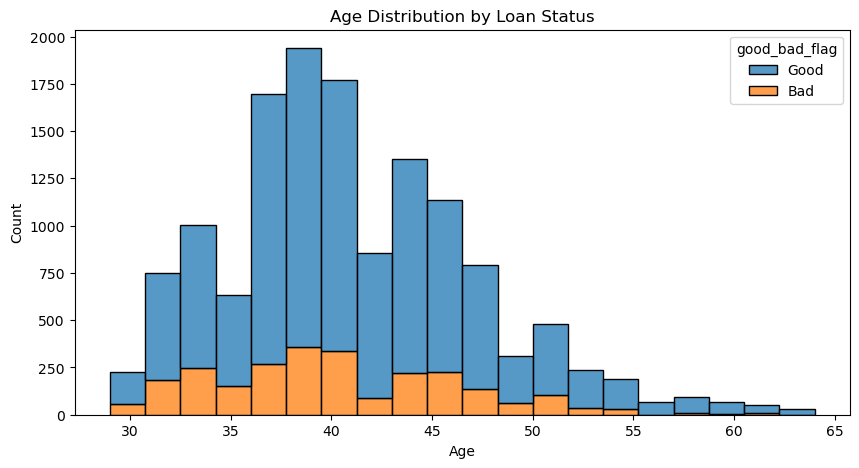

In [230]:
# Age Vs Loan Status
plt.figure(figsize=(10,5))
sns.histplot(data = df_master, x= 'age', hue = 'good_bad_flag', multiple = 'stack', bins = 20)
plt.title ('Age Distribution by Loan Status')
plt.xlabel ('Age')
plt.ylabel ('Count')
plt.show()

<Figure size 1000x500 with 0 Axes>

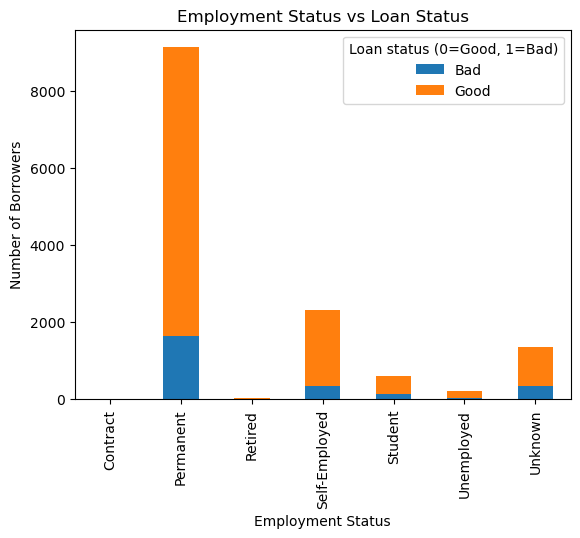

In [231]:
# Employment Status Vs Loan Status
plt.figure(figsize=(10,5))
employment_counts = pd.crosstab (df_master['employment_status_clients'], df_master['good_bad_flag'])
employment_counts.plot(kind='bar', stacked=True)
plt.title ('Employment Status vs Loan Status')
plt.xlabel ('Employment Status')
plt.ylabel ('Number of Borrowers')
plt.legend(title='Loan status (0=Good, 1=Bad)')
plt.show()

In [235]:
!pip install folium
import folium

In [241]:
# create a map centered around the average coordinates
map = folium.Map(location= [df_master['latitude_gps'].mean(), df_master['longitude_gps'].mean()], zoom_start=6)



In [242]:
#Add markers for each customers
for _, row in df_master.iterrows():
    folium.Marker(
        location=[row['latitude_gps'], row ['longitude_gps']],
        popup = f'Customer {row['customerid']}'
    ).add_to(map)